In [4]:
#Convert image'type:
from skimage.util import

img_as_float: Convert to 64-bit floating point
img_as_ubyte: Convert to 8-bit uint
img_as_uint: Convert to 16-bit uint
img_as_int: Convert to 16-bit int
    
import cv2
#read image
img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
img = cv.imread('GB_2218_O.tif', cv.IMREAD_COLOR)
img = cv.imread('GB_2218_O.tif', cv.IMREAD_UNCHANGED)
#convert
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
rgb_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

-1

In [3]:
#Image transform
import numpy as np
import cv2

#duplicate image
image = cv2.imread('GB_2218_O.tif', cv2.IMREAD_GRAYSCALE)
img_2 = image.copy()
cv2.namedWindow('Duplicate Image', cv2.WINDOW_NORMAL)
cv2.resizeWindow('Duplicate Image', 600, 600)
cv2.imshow("Duplicate Image", img_2)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

#crop image
import cv2
image = cv2.imread('GB_2218_O.tif', cv2.IMREAD_GRAYSCALE)
crop_img = image[100:200, 100:200]
cv2.namedWindow('Cropped Image', cv2.WINDOW_NORMAL)
cv2.resizeWindow('Cropped Image', 600, 600)
cv2.imshow("Cropped Image", crop_img)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

#translate image
shiftX = 10
shiftY = 10
M = np.float32([[1, 0, shiftX],[0, 1, shiftY]])
shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
cv2.imshow("Shifted Down and Right", shifted)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

##rotate image
# grab the dimensions of the image and calculate the center of the image
(h, w) = image.shape[:2]
(cX, cY) = (w // 2, h // 2)
# rotate our image by 45 degrees around the center of the image
degree = 45
M = cv2.getRotationMatrix2D((cX, cY), degree, 1.0) #scale = 1
rotated = cv2.warpAffine(image, M, (w, h))
cv2.imshow("Rotated by 45 Degrees", rotated)
key = cv2.waitKey(0)
cv2.destroyAllWindows()
#imutils
import imutils
rotated = imutils.rotate(image, 180)
cv2.imshow("Rotated by 180 Degrees", rotated)
key = cv2.waitKey(0)
cv2.destroyAllWindows()
#ensuring the entire rotated image still renders within the viewing area
rotated = imutils.rotate_bound(image, -33)
cv2.imshow("Rotated Without Cropping", rotated)
cv2.waitKey(0)
key = cv2.waitKey(0)
cv2.destroyAllWindows()

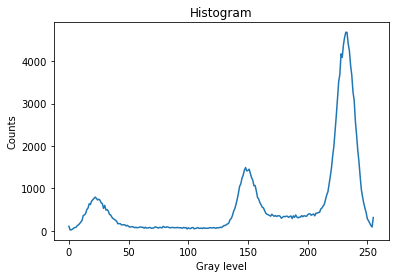

In [14]:
#Plot image's histogram
import cv2
import numpy as np

def Histogram(image):
    if image.dtype == 'uint8':
        hist = cv2.calcHist([image], [0], None, [256], [0, 256])
        plt.plot(np.arange(0, 256, 1), np.array(hist).squeeze())
    elif image == 'uint16':
        hist = cv2.calcHist([image], [0], None, [256], [0, 65536])
        plt.plot(np.arange(0, 65536, 256), np.array(hist).squeeze())
    plt.title('Histogram')
    plt.xlabel('Gray level'), plt.ylabel('Counts')
    plt.show()
    
image = cv2.imread('GB_2218_O.tif', cv2.IMREAD_GRAYSCALE)
Histogram(image)

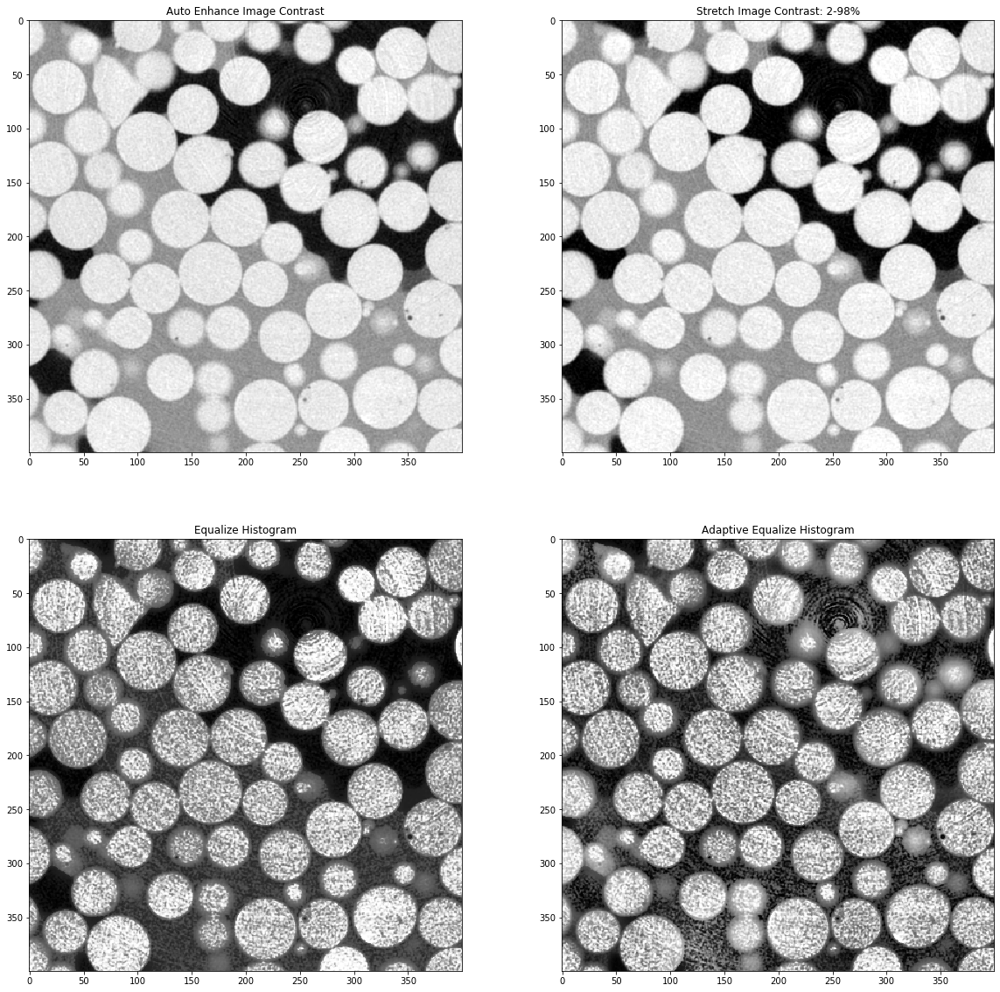

In [11]:
#Enhance Image Contrast
import cv2
import cv2 as cv
import numpy as np
from skimage import exposure
from matplotlib import pyplot as plt

def EnhImgContrAuto(image):
    if image.dtype == 'uint8':
        hist = cv.calcHist([image], [0], None, [256], [0, 256])
        GV = np.arange(0, 256, 1)
    elif image.dtype == 'uint16':
        hist = cv.calcHist([image], [0], None, [256], [0, 65536])
        GV = np.arange(0, 65536, 256)
    vr = np.nonzero(np.array(hist).squeeze())
    pvmin = np.amin(vr)
    pvmax = np.amax(vr)
    vmin=GV[pvmin]
    vmax=GV[pvmax]
    return vmin, vmax

def EnhImgContrStretch(image):
    p2, p98 = np.percentile(image, (2, 98))
    img = exposure.rescale_intensity(image, in_range=(p2, p98))
    return img

def EnhImgContrEquHis(image):
    img = exposure.equalize_hist(image)
    return img

def EnhImgContrAdapEquHis(image):
    img = exposure.equalize_adapthist(image, clip_limit=0.03) #cv.equalizeHist(self.img) only for 8bit image
    return img
    
image = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
vmin, vmax = EnhImgContrAuto(image)
img1 = EnhImgContrStretch(image)
img2 = EnhImgContrEquHis(image)
img3 = EnhImgContrAdapEquHis(image)

fig, axs = plt.subplots(2, 2, figsize=(20,20))
axs[0, 0].imshow(image, vmin=vmin, vmax=vmax, cmap='gray')
axs[0, 0].set_title('Auto Enhance Image Contrast')
axs[0, 1].imshow(img1, cmap='gray')
axs[0, 1].set_title('Stretch Image Contrast: 2-98%')
axs[1, 0].imshow(img2, cmap='gray')
axs[1, 0].set_title('Equalize Histogram')
axs[1, 1].imshow(img3, cmap='gray')
axs[1, 1].set_title('Adaptive Equalize Histogram')
plt.show()

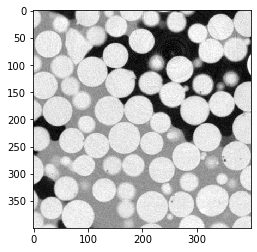

In [13]:
#Normalize Image
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

def NormImg(image):
    if image.dtype == 'uint8':
        img = cv.normalize(image, dst=None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)
        return img
    elif image.dtype == 'uint16':
        img = cv.normalize(image, dst=None, alpha=0, beta=65535, norm_type=cv.NORM_MINMAX)
        return img

image = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
img = NormImg(image)
plt.imshow(img, cmap="gray")
plt.show()

In [ ]:
#Modify brightness & contrast of image 8bit
import cv2

def funcBrightContrast(bright=0):
    bright = cv2.getTrackbarPos('bright', 'Original Image')
    contrast = cv2.getTrackbarPos('contrast', 'Original Image')
    effect = apply_brightness_contrast(img,bright,contrast)
    cv2.imshow('Effect', effect)
    
def apply_brightness_contrast(input_img, brightness = 255, contrast = 127):
    brightness = map(brightness, 0, 510, -255, 255)
    contrast = map(contrast, 0, 254, -127, 127)
    if brightness != 0:
        if brightness > 0:
            shadow = brightness
            highlight = 255
        else:
            shadow = 0
            highlight = 255 + brightness
        alpha_b = (highlight - shadow)/255
        gamma_b = shadow
        buf = cv2.addWeighted(input_img, alpha_b, input_img, 0, gamma_b)
    else:
        buf = input_img.copy()
    if contrast != 0:
        f = float(131 * (contrast + 127)) / (127 * (131 - contrast))
        alpha_c = f
        gamma_c = 127*(1-f)
        buf = cv2.addWeighted(buf, alpha_c, buf, 0, gamma_c)
    cv2.putText(buf,'B:{},C:{}'.format(brightness,contrast),(10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
    return buf

def map(x, in_min, in_max, out_min, out_max):
    return int((x-in_min) * (out_max-out_min) / (in_max-in_min) + out_min)

original = cv2.imread('GB_2218_O.tif', cv2.IMREAD_COLOR)
img = original.copy()
cv2.namedWindow('Original Image',1)

bright = 255
contrast = 127
#Brightness value range -255 to 255
#Contrast value range -127 to 127
cv2.createTrackbar('bright', 'Original Image', bright, 2*255, funcBrightContrast)
cv2.createTrackbar('contrast', 'Original Image', contrast, 2*127, funcBrightContrast)
funcBrightContrast(0)

cv2.imshow('Original Image', original)
cv2.waitKey(0)

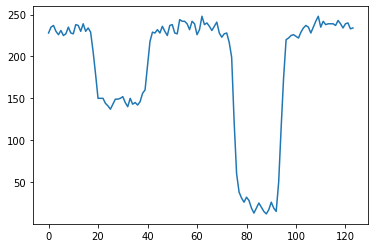

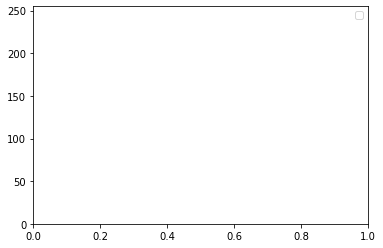

In [15]:
#profile line
import cv2
from matplotlib import pyplot as plt
import numpy as np
from skimage import draw

# Actual mouse callback function
def print_coords(event, x, y, flags, param):

    # Global variables needed
    global image, image_copy, r_start, c_start

    # If left mouse button is clicked, start of line
    if (event == cv2.EVENT_LBUTTONDOWN):
        r_start = x
        c_start = y

    # If left mouse button is clicked, end of line; plot intensity profile
    if (event == cv2.EVENT_LBUTTONUP):
        r_end = x
        c_end = y
        image = cv2.line(image_copy.copy(), (r_start, c_start), (r_end, c_end), (0, 255, 255), 2)
        line = np.transpose(np.array(draw.line(r_start, c_start, r_end, c_end)))
        data = image_copy.copy()[line[:, 1], line[:, 0]]
        plt.close()
        plt.figure('Intensity profile')
        plt.plot(np.arange(0, len(line[:,0])), data)
        plt.draw()
        plt.pause(0.001)
        plt.legend(['Gray Value'])
        plt.ylim((0, 255))

# Read an image
image = cv2.imread('GB_2218_O.tif', cv2.IMREAD_GRAYSCALE)
image_copy = image.copy()

# Set up window and mouse callback function
cv2.namedWindow("image")
cv2.setMouseCallback("image", print_coords)

# Loop until the 'c' key is pressed
while True:

    # Display image; wait for keypress
    cv2.imshow("image", image)
    key = cv2.waitKey(1) & 0xFF

    # If 'c' key is pressed, break from loop
    if  key == ord("c"):
        break

cv2.destroyAllWindows()

(400, 400) (400, 400)


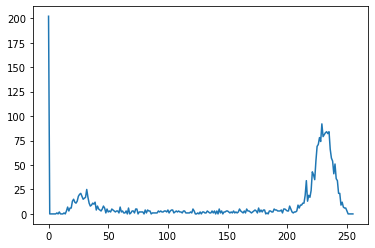

(400, 400) (400, 400)


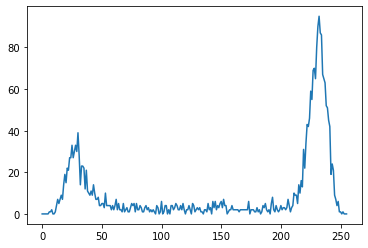

In [2]:
#histogram of rectangle zone (50x50, 8bit image)
import cv2
import numpy as np
from skimage import draw
from matplotlib import pyplot as plt

# mouse callback function
def draw_rectangle(event,x,y,flags,param):
    if event == cv2.EVENT_LBUTTONDBLCLK:
        cv2.rectangle(image,(x,y),(x+50, y+50),(0,255,255),3)
        rr, cc = draw.rectangle((x,y),(x+50, y+50))
        mask = np.zeros(image.shape[:2], np.uint8)
        mask[rr, cc] = 255
        print(image.shape, mask.shape)
        hist = cv2.calcHist([image],[0],mask,[256],[0,256])
        plt.close()
        plt.plot(np.arange(256), hist)
        plt.show()

# Read an image
image = cv2.imread('GB_2218_O.tif', cv2.IMREAD_GRAYSCALE)

# Create a black image, a window and bind the function to window
cv2.namedWindow('image')
cv2.setMouseCallback('image',draw_rectangle)

while True:

    # Display image; wait for keypress
    cv2.imshow("image", image)
    key = cv2.waitKey(1) & 0xFF

    # If 'c' key is pressed, break from loop
    if  key == ord("c"):
        break

cv2.destroyAllWindows()

(400, 400) (400, 400)


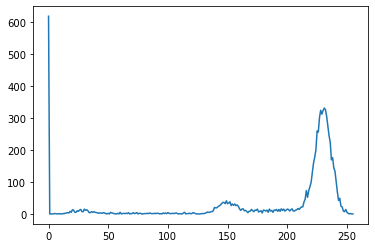

In [3]:
#histogram of circle zone
import cv2
import numpy as np
from skimage import draw
from matplotlib import pyplot as plt

# mouse callback function
def draw_rectangle(event,x,y,flags,param):
    if event == cv2.EVENT_LBUTTONDBLCLK:
        cv2.circle(image,(x,y),50,(0,255,255),3)
        rr, cc = draw.circle(x, y, 50)
        mask = np.zeros(image.shape[:2], np.uint8)
        mask[rr, cc] = 255
        print(image.shape, mask.shape)
        hist = cv2.calcHist([image],[0],mask,[256],[0,256])
        plt.close()
        plt.plot(np.arange(256), hist)
        plt.show()

# Read an image
image = cv2.imread('GB_2218_O.tif', cv2.IMREAD_GRAYSCALE)

# Create a black image, a window and bind the function to window
cv2.namedWindow('image')
cv2.setMouseCallback('image',draw_rectangle)

while True:

    # Display image; wait for keypress
    cv2.imshow("image", image)
    key = cv2.waitKey(1) & 0xFF

    # If 'c' key is pressed, break from loop
    if  key == ord("c"):
        break

cv2.destroyAllWindows()

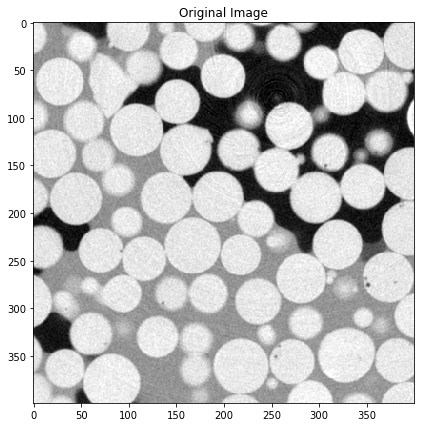

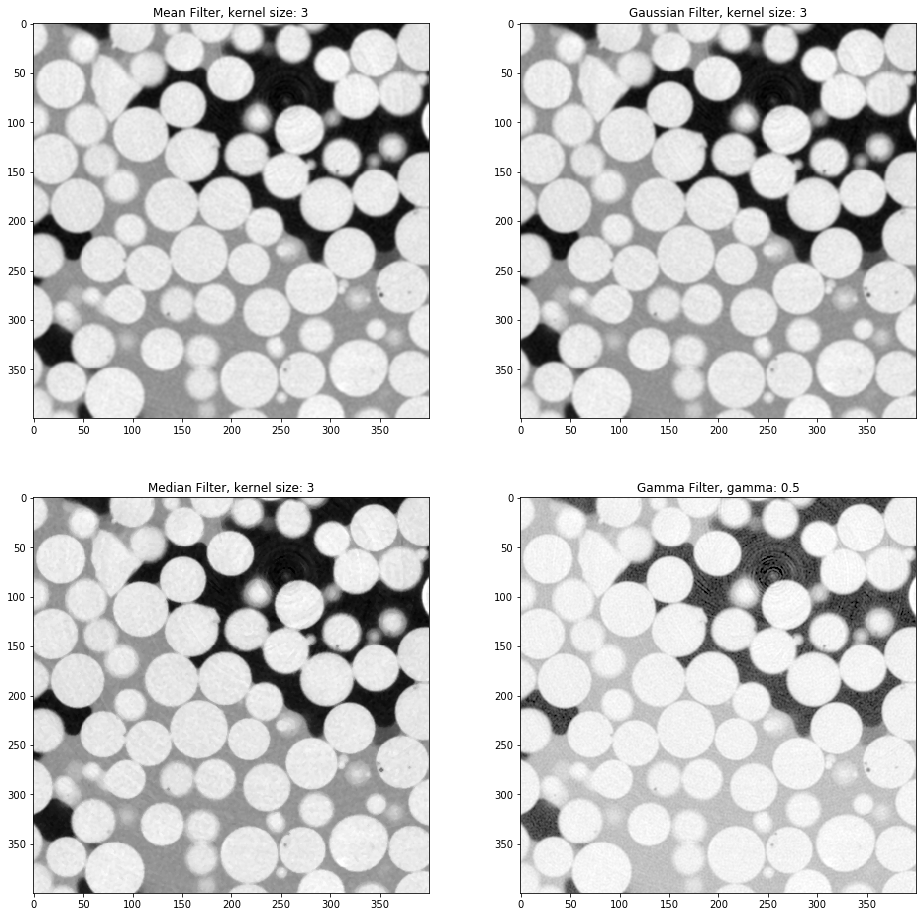

In [26]:
#Filter images
import cv2 as cv
from matplotlib import pyplot as plt
from skimage import exposure

def BlurFilter(image, k):
    img = cv.blur(image, (k, k), cv.BORDER_CONSTANT)
    return img

def GaussFilter(image, k):
    img = cv.GaussianBlur(image, (k, k), cv.BORDER_DEFAULT)
    return img

def MedianFilter(image,k):
    img = cv.medianBlur(image, k)
    return img

def GammaFilter(image, gamma):
    img = exposure.adjust_gamma(image, gamma=gamma)
    return img

# Read an image
img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
img1 = BlurFilter(image, 3)
img2 = GaussFilter(image, 3)
img3 = MedianFilter(image, 3)
img4 = GammaFilter(image, 0.5)

plt.figure(figsize=(7,7))
plt.imshow(img, cmap='gray')
plt.title('Original Image')

fig, axs = plt.subplots(2, 2, figsize=(16,16))
axs[0, 0].imshow(img1, cmap='gray')
axs[0, 0].set_title('Mean Filter, kernel size: 3')
axs[0, 1].imshow(img2, cmap='gray')
axs[0, 1].set_title('Gaussian Filter, kernel size: 3')
axs[1, 0].imshow(img3, cmap='gray')
axs[1, 0].set_title('Median Filter, kernel size: 3')
axs[1, 1].imshow(img4, cmap='gray')
axs[1, 1].set_title('Gamma Filter, gamma: 0.5')
plt.show()

Text(0.5, 1.0, 'Denoisiing Image')

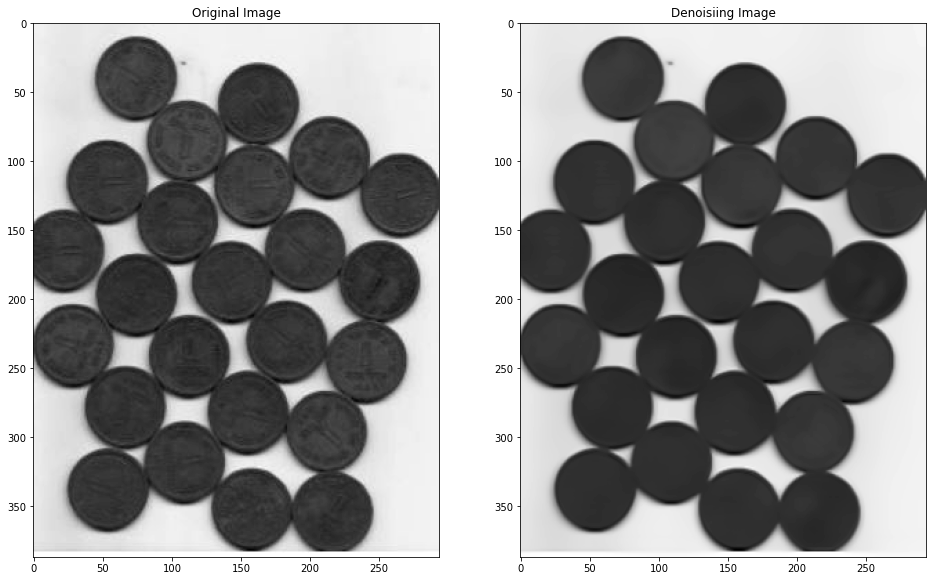

In [23]:
#Non-local Means Denoising Filter
import numpy as np
import cv2 as cv
from skimage.util import random_noise
from skimage.util import img_as_ubyte#: Convert to 8-bit uint
from matplotlib import pyplot as plt

# Read an image
img = cv.imread('Objects.jpg', cv.IMREAD_GRAYSCALE)
#add noise
#img_noise = img + 255*random_noise(img, mode='gaussian', var=0.09) #float
#denoise 
#img_noise = img_noise.astype(np.uint8)
img_denoising = cv.fastNlMeansDenoising(img,None,10,7,21)

fig, axs = plt.subplots(1, 2, figsize=(16,16))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(img_denoising, cmap='gray')
axs[1].set_title('Denoisiing Image')

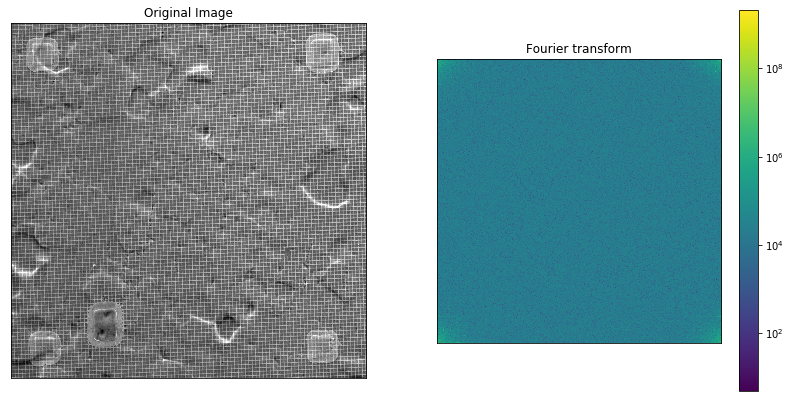

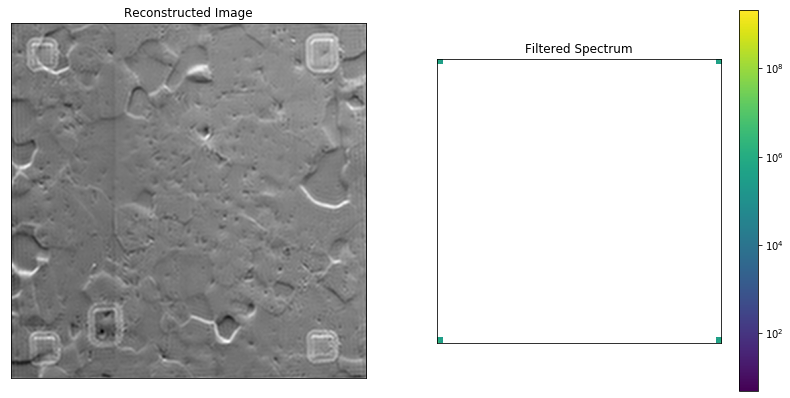

In [10]:
#2D FFT denoising filter 
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from matplotlib.colors import LogNorm

img = cv.imread('microgrid_SEM.tif', cv.IMREAD_GRAYSCALE)

im_fft = np.fft.fft2(img)

plt.figure(figsize=(14,7))
plt.subplot(121), plt.imshow(img, cmap='gray'), plt.title('Original Image')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(np.abs(im_fft), norm=LogNorm(vmin=5)), plt.title('Fourier transform'), plt.colorbar()
plt.xticks([]), plt.yticks([])
plt.show()

# In the lines following, we'll make a copy of the original spectrum and truncate coefficients
# Define the fraction of coefficients (in each direction) we keep
keep_fraction = 0.02
im_fft2 = im_fft.copy()
# Set r and c to be the number of rows and columns of the array.
r, c = im_fft2.shape
# Set to zero all rows with indices between r*keep_fraction and r*(1-keep_fraction)
im_fft2[int(r * keep_fraction):int(r * (1 - keep_fraction))] = 0
# Similarly with the columns:
im_fft2[:, int(c * keep_fraction):int(c * (1 - keep_fraction))] = 0

# Reconstruct the denoised image from the filtered spectrum, keep only the real part for display.
im_new = np.fft.ifft2(im_fft2).real

plt.figure(figsize=(14,7))
plt.subplot(121), plt.imshow(im_new, cmap='gray'), plt.title('Reconstructed Image')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(np.abs(im_fft2), norm=LogNorm(vmin=5)), plt.title('Filtered Spectrum'), plt.colorbar()
plt.xticks([]), plt.yticks([])
plt.show()

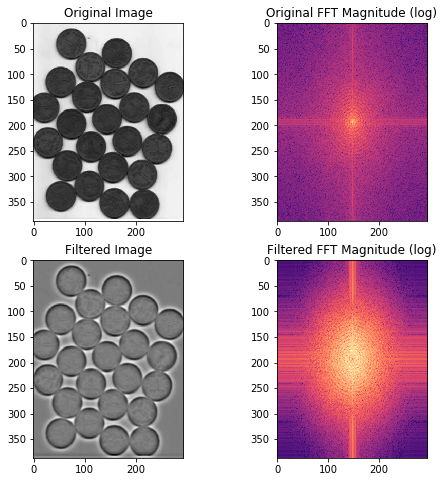

In [20]:
#Band-pass filters attenuate signal frequencies outside of a range (band) of interest: subtract an image blurred with a Gaussian kernel from a less-blurred image
#To denoise image and reduce shadows OR to enhance edges 
import matplotlib.pyplot as plt
import numpy as np
from skimage.data import gravel
from skimage.filters import difference_of_gaussians, window
from scipy.fftpack import fftn, fftshift
import cv2 as cv

image = cv.imread('Objects.jpg', cv.IMREAD_GRAYSCALE)

wimage = image #* window('hann', image.shape)  # window image to improve FFT
filtered_image = difference_of_gaussians(image, 1, 5)
filtered_wimage = filtered_image #* window('hann', image.shape)
im_f_mag = fftshift(np.abs(fftn(wimage)))
fim_f_mag = fftshift(np.abs(fftn(filtered_wimage)))

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
ax[0, 0].imshow(image, cmap='gray')
ax[0, 0].set_title('Original Image')
ax[0, 1].imshow(np.log(im_f_mag), cmap='magma')
ax[0, 1].set_title('Original FFT Magnitude (log)')
ax[1, 0].imshow(filtered_image, cmap='gray')
ax[1, 0].set_title('Filtered Image')
ax[1, 1].imshow(np.log(fim_f_mag), cmap='magma')
ax[1, 1].set_title('Filtered FFT Magnitude (log)')
plt.show()

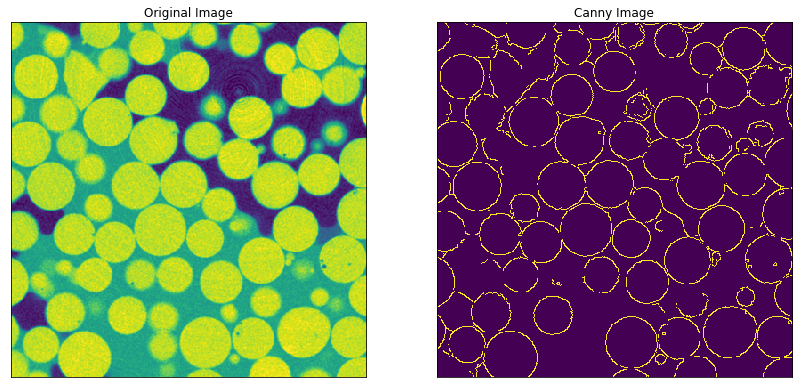

In [60]:
#Edge detection
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
img = cv.medianBlur(image, 1)
resized_img = cv.resize(img, (400, 400))

#Edge detection
canny_img = cv.Canny(resized_img, 150, 255)#thresholds

plt.figure(figsize=(14,7))
plt.subplot(121), plt.imshow(resized_img), plt.title('Original Image')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(canny_img), plt.title('Canny Image')
plt.xticks([]), plt.yticks([])
plt.show()

Number of detected contours 24


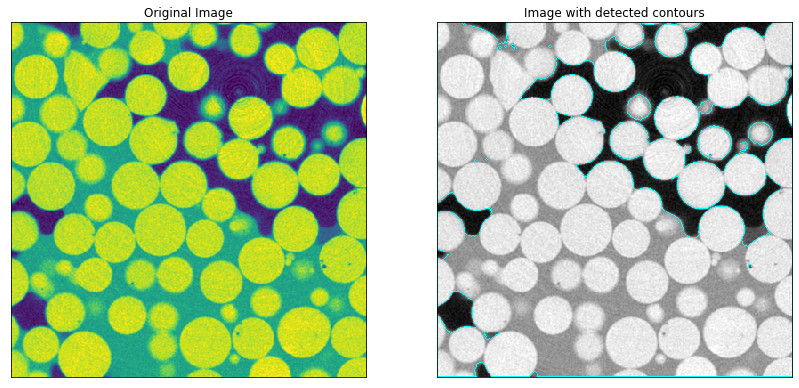

In [112]:
#Contour detection
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
img = cv.medianBlur(image, 1)
resized_img = cv.resize(img, (400, 400))

ret, thres = cv.threshold(resized_img, 190, 255, cv.THRESH_OTSU + cv.THRESH_BINARY)
contours, hierarchy = cv.findContours(thres, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

color_img = cv.cvtColor(resized_img, cv.COLOR_GRAY2RGB)
img = cv.drawContours(color_img, contours, -1, (0,255,255), 1)
print('Number of detected contours ' + str(len(contours)))

plt.figure(figsize=(14,7))
plt.subplot(121), plt.imshow(resized_img), plt.title('Original Image')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(color_img), plt.title('Image with detected contours')
plt.xticks([]), plt.yticks([])
plt.show()

In [100]:
#Hough circles
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

gray_img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
rgb_img = cv.cvtColor(gray_img, cv.COLOR_BGR2RGB)
gray_blurred = cv.medianBlur(gray_img, 3)

detected_circles = cv.HoughCircles(gray_blurred, cv.HOUGH_GRADIENT, dp=2., minDist=5, param1=100, param2=90, minRadius=0, maxRadius=50)

if detected_circles is not None:
    detected_circles = np.uint16(np.around(detected_circles))
    for i in detected_circles[0,:]:
        a, b, r = i[0], i[1], i[2]
        cv.circle(rgb_img, (a,b), r, (0,255,0), 2)
        cv.circle(rgb_img, (a,b), 1, (0,0,0), 3)
    cv.imshow('Image with detected circles', rgb_img)
    cv.waitKey()
    cv.destroyAllWindows()

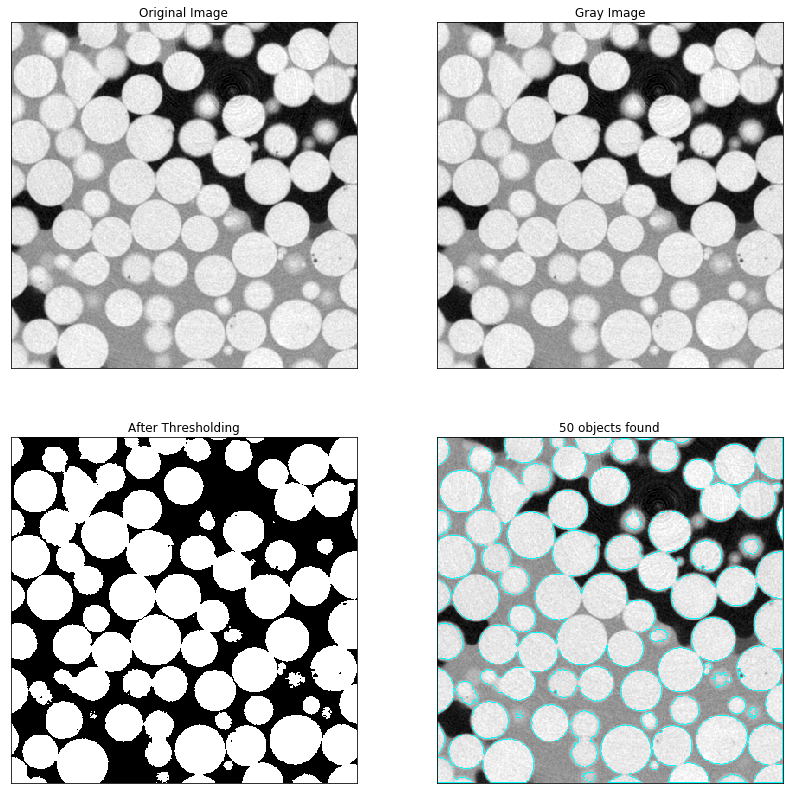

In [111]:
#Detect objects
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import imutils

img = cv.imread('GB_2218_O.tif', cv.IMREAD_COLOR)
resized_img = cv.resize(img, (400, 400))
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
rgb_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

#Counting objects
ret, thres = cv.threshold(gray_img, 190, 255, cv.THRESH_BINARY)
cnts = cv.findContours(thres.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

cnts = imutils.grab_contours(cnts)
output = resized_img.copy()

cv.drawContours(output, cnts, -1, (0,255,255), 1)
text = "{} objects found".format(len(cnts))

plt.figure(figsize=(14,14))
plt.subplot(221), plt.imshow(rgb_img), plt.title('Original Image')
plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(gray_img, cmap='gray'), plt.title('Gray Image')
plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(thres, cmap='gray'), plt.title('After Thresholding')
plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(output), plt.title(text)
plt.xticks([]), plt.yticks([])
plt.show()

In [3]:
#Measure local properties
import plotly
import plotly.express as px
import plotly.graph_objects as go
from skimage import data, filters, measure, morphology
import cv2 as cv
import pandas as pd

threshold = 190

img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
img = cv.medianBlur(img, 3)

mask = img > threshold
mask = morphology.remove_small_objects(mask, 50)
mask = morphology.remove_small_holes(mask, 50)
labels = measure.label(mask)

props = measure.regionprops(labels, img)
properties = ['area', 'orientation', 'perimeter', 'eccentricity']#, 'intensity_mean', 'axis_major_length', 'axis_minor_length'

#plot figure
fig = px.imshow(img)
fig.update_traces(hoverinfo='skip') # hover is only for label info
# For each label, add a filled scatter trace for its contour, and display the properties of the label in the hover of this trace.
for index in range(1, labels.max()):
    label_i = props[index].label
    contour = measure.find_contours(labels == label_i, 0.5)[0]
    y, x = contour.T
    hoverinfo = ''
    for prop_name in properties:
        hoverinfo += f'<b>{prop_name}: {getattr(props[index], prop_name):.2f}</b><br>'
    fig.add_trace(go.Scatter(
        x=x, y=y, name=label_i,
        mode='lines', fill='toself', showlegend=False,
        hovertemplate=hoverinfo, hoveron='points+fills'))
plotly.io.show(fig)

#Save .csv
props = measure.regionprops_table(labels, properties=('area', 'orientation', 'perimeter', 'eccentricity'))
df = pd.DataFrame(props)
print(df)
df.to_csv('Region_Properties.csv')

     area  orientation    perimeter  eccentricity
0     375    -0.051940    81.455844      0.891834
1    1137    -1.521412   134.183766      0.727594
2    2759    -1.373716   337.421356      0.918066
3     111     1.566258    44.727922      0.928039
4    7124    -1.197678   642.641702      0.668496
5     920     0.003499   112.325902      0.424475
6   28596     0.364156  2362.560713      0.770247
7    1604     1.143292   147.882251      0.320863
8    1945    -1.109001   161.781746      0.143426
9     381    -0.002363    80.662951      0.842159
10    168     0.005396    71.556349      0.977286
11    284     0.220972    63.355339      0.566535
12  14504     0.830819  1242.993037      0.901891
13   4174     0.467750   330.492424      0.901333
14    257    -1.551351    58.284271      0.250729
15    969     0.918773   119.396970      0.316592
16    431    -0.001250    89.734019      0.878306
17   6082    -0.953090   498.073160      0.950981
18   1086     0.058680   126.183766      0.702068


Text(0.5, 1.0, 'Segmented Image: Otsu method')

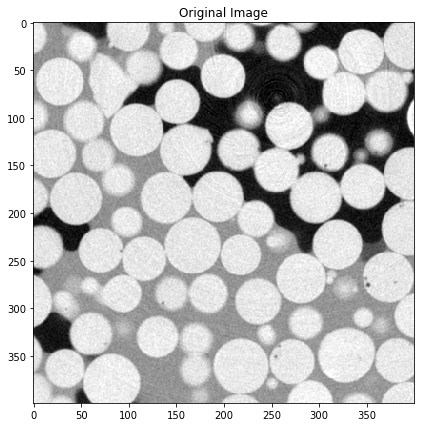

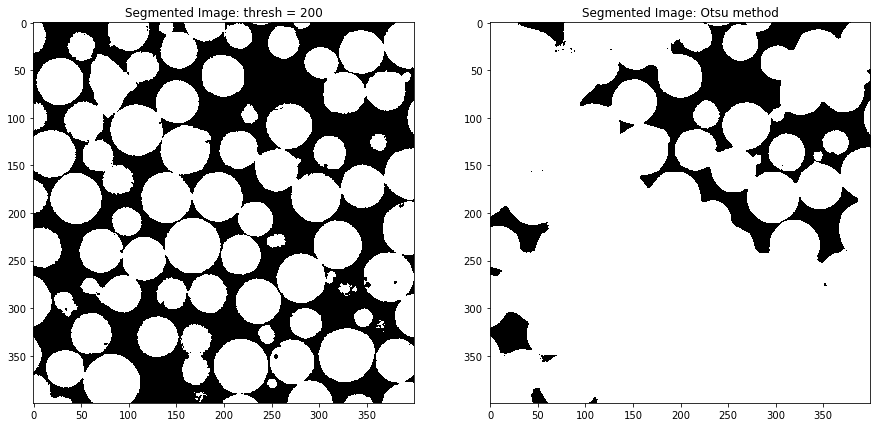

In [29]:
#Segmentations
import cv2 as cv
from matplotlib import pyplot as plt

def B_Threshold(image, thresh):
    if image.dtype == 'uint8':
        ret, img = cv.threshold(image, thresh, 255, cv.THRESH_BINARY)
        return img
    elif image.dtype == 'uint16':
        ret, img = cv.threshold(image, thresh, 65535, cv.THRESH_BINARY)
        return img
    
def OtB_Threshold(image):
    if image.dtype == 'uint8':
        ret, img = cv.threshold(image, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
        return img
    elif image.dtype == 'uint16':
        ret, img = cv.threshold(image, 0, 65535, cv.THRESH_BINARY + cv.THRESH_OTSU)
        return img
        
# Read an image
img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)
img = cv.medianBlur(image, 1)

img1 = B_Threshold(img, 200)
img2 = OtB_Threshold(img)

plt.figure(figsize=(7,7))
plt.imshow(img, cmap='gray')
plt.title('Original Image')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7.5))
ax1.imshow(img1, cmap='gray')
ax1.set_title('Segmented Image: thresh = 200')
ax2.imshow(img2, cmap='gray')
ax2.set_title('Segmented Image: Otsu method')

Text(0.5, 1.0, 'Result')

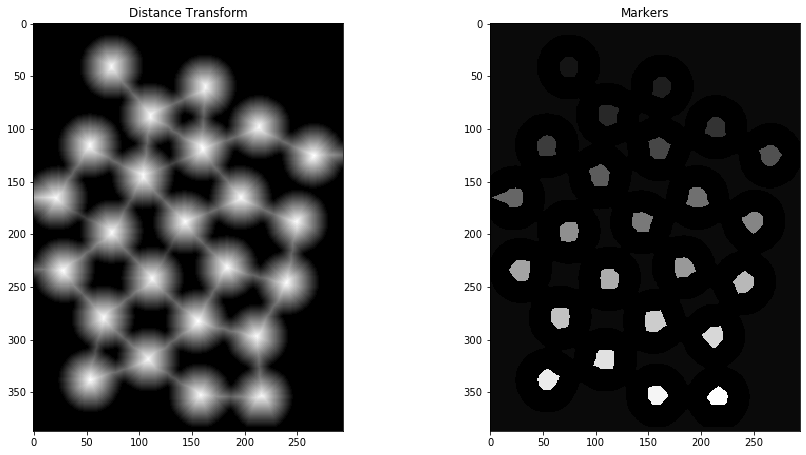

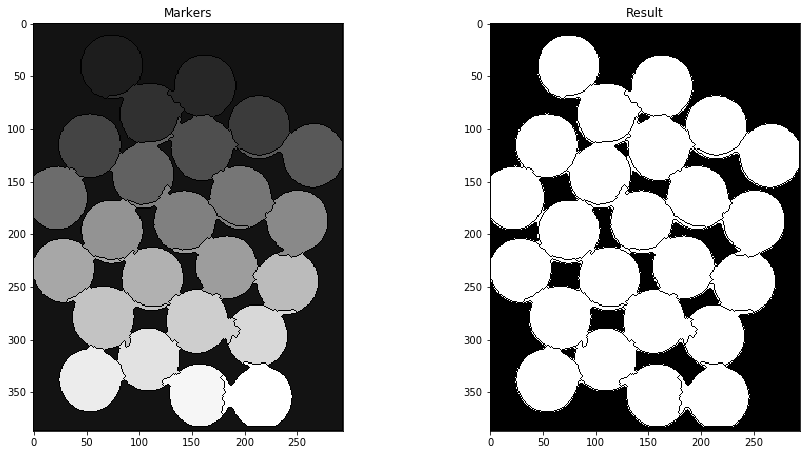

In [4]:
#watershed segmentation
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('Objects.jpg')
img = cv.medianBlur(img, 3)

gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

# noise removal
kernel = np.ones((1,1),np.uint8)
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN,kernel,iterations = 1)

# sure background area
sure_bg = cv.dilate(opening,kernel,iterations=1)

# Finding sure foreground area
dist_transform = cv.distanceTransform(opening,cv.DIST_L2,3)
ret, sure_fg = cv.threshold(dist_transform,0.7*dist_transform.max(),255,0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg,sure_fg)

# Marker labelling
ret, markers = cv.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7.5))
ax1.imshow(dist_transform, cmap='gray')
ax1.set_title('Distance Transform')
ax2.imshow(markers, cmap='gray')
ax2.set_title('Markers')

markers = cv.watershed(img,markers)#The boundary region will be marked with -1
thresh[markers == -1] = 0

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7.5))
ax1.imshow(markers, cmap='gray')
ax1.set_title('Markers')
ax2.imshow(thresh, cmap='gray')
ax2.set_title('Result')

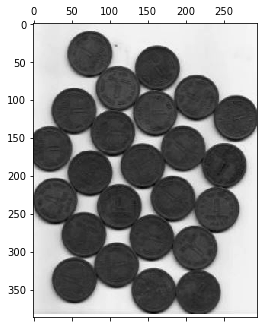

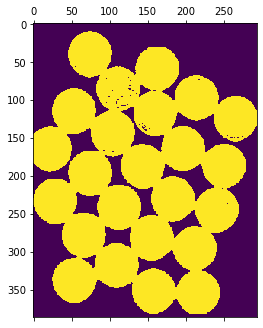

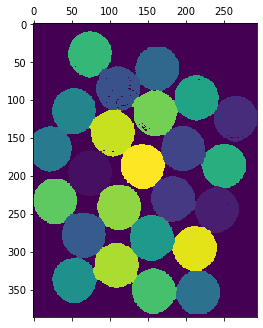

In [2]:
#Spectral clustering for image segmentation
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

img = cv.imread('Objects.jpg', cv.IMREAD_GRAYSCALE)
img = img.astype(float)
mask = img<110

graph = image.img_to_graph(img, mask=mask)
graph.data = np.exp(-graph.data / graph.data.std())

labels = spectral_clustering(graph, n_clusters=24, eigen_solver='arpack')
label_im = np.full(mask.shape, -1.)
label_im[mask] = labels

plt.matshow(img, cmap='gray')
plt.matshow(mask)
plt.matshow(label_im)
plt.show()

Text(0.5, 1.0, 'Sobel Edges')

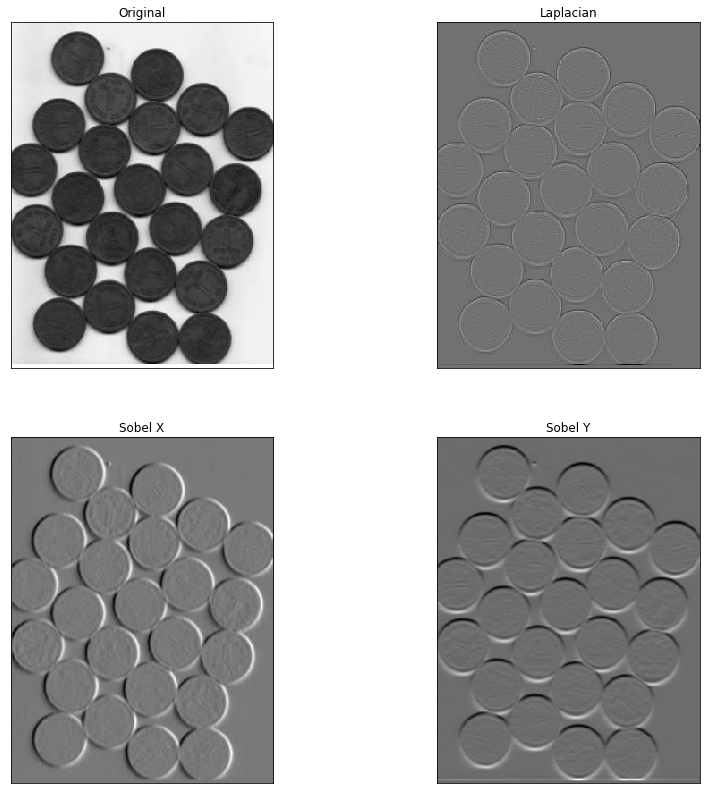

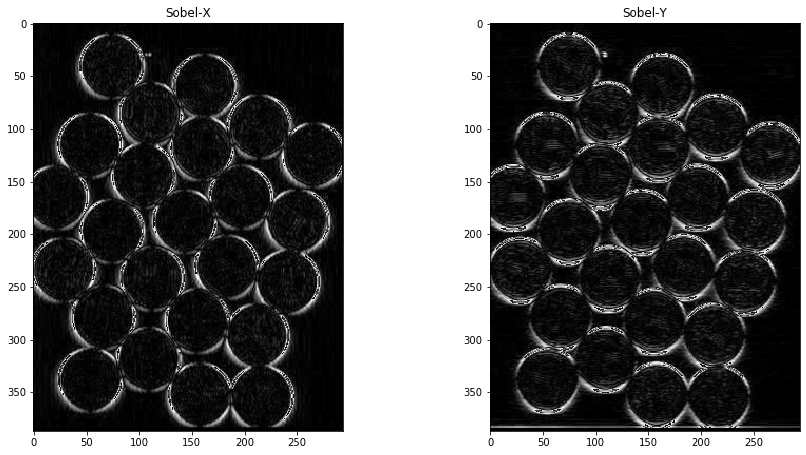

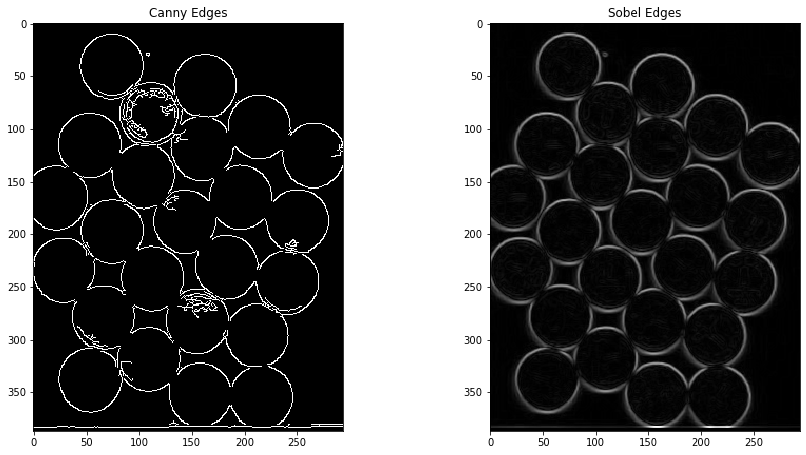

In [15]:
#Image gradients
import numpy as np
import cv2 
from matplotlib import pyplot as plt

img = cv2.imread('Objects.jpg', 0)

laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

plt.figure(figsize=(14,14))
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

# to detect both edges (positive & negatives)
sobelx64f = cv2.Sobel(img,cv2.CV_64F,1,0)
abs_sobelx64f = np.absolute(sobelx64f)
sobelx_8u = np.uint8(abs_sobelx64f)
sobely64f = cv2.Sobel(img,cv2.CV_64F,0,1)
abs_sobely64f = np.absolute(sobely64f)
sobely_8u = np.uint8(abs_sobely64f)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7.5))
ax1.imshow(sobelx_8u, cmap='gray')
ax1.set_title('Sobel-X')
ax2.imshow(sobely_8u, cmap='gray')
ax2.set_title('Sobel-Y')

#Sobel edge detection
edge = np.sqrt(np.square(abs_sobelx64f) + np.square(abs_sobely64f))
#Canny edge detection
canny_img = cv2.Canny(img, 0, 255)#thresholds
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7.5))
ax1.imshow(canny_img, cmap='gray')
ax1.set_title('Canny Edges')
ax2.imshow(edge, cmap='gray')
ax2.set_title('Sobel Edges')

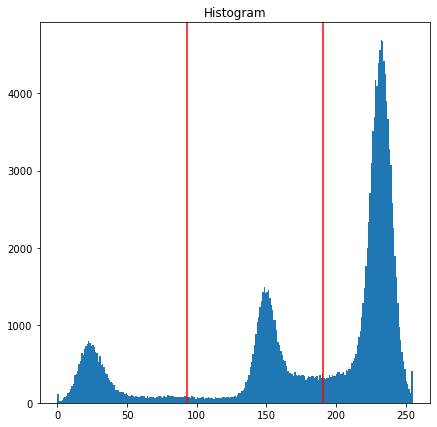

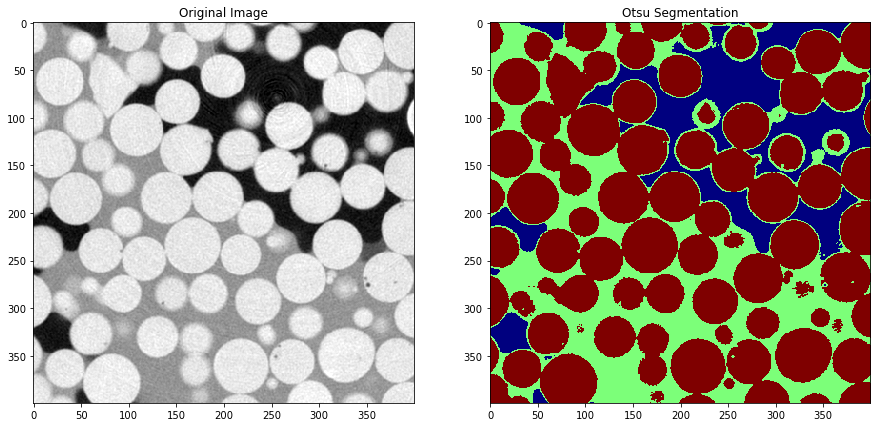

In [4]:
#Otsu segmentation for multiple-phase media
import numpy as np
import cv2 
from matplotlib import pyplot as plt
from skimage.filters import threshold_multiotsu

img = cv2.imread('GB_2218_O.tif', cv2.IMREAD_GRAYSCALE)
k = 3 #number of phases
# Applying multi-Otsu threshold for the default value, generating three classes
thresholds = threshold_multiotsu(img, classes=k)
# Plotting the histogram and the two thresholds obtained from multi-Otsu
plt.figure(figsize=(7, 7))
plt.hist(img.ravel(), bins=255)
plt.title('Histogram')
for thresh in thresholds:
    plt.axvline(thresh, color='r')
plt.show()
# Using the threshold values, we generate the three regions
regions = np.digitize(img, bins=thresholds)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7.5))
ax1.imshow(img, cmap='gray')
ax1.set_title('Original Image')
ax2.imshow(regions, cmap='jet')
ax2.set_title('Otsu Segmentation')
plt.show()

C:\Users\thi-xiu.le\AppData\Local\Continuum\miniconda3\lib\site-packages\ipykernel_launcher.py:14: UserWarning: The probability range is outside [0, 1] given the tolerance `prob_tol`. Consider decreasing `beta` and/or decreasing `tol`.
  


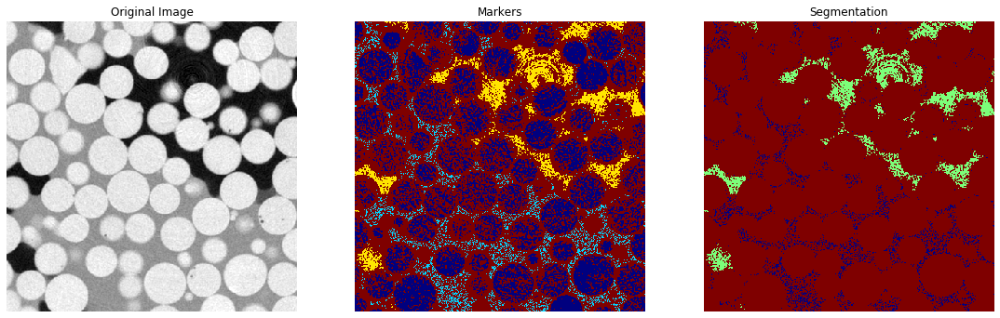

In [21]:
#Segmentation using Random Merkers (anisotropic diffusion)
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from skimage.segmentation import random_walker

Img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)

Markers = cv.imread('Markers.tif', cv.IMREAD_GRAYSCALE)
min = np.amin(Markers)
Markers = Markers - min

# Run random walker algorithm
Labels = random_walker(Img, Markers, beta=30)

# Plot results
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(19, 6), sharex=True, sharey=True)
ax1.imshow(Img, cmap='gray')
ax1.axis('off')
ax1.set_title('Original Image')
ax2.imshow(Markers, cmap='jet')
ax2.axis('off')
ax2.set_title('Markers')
ax3.imshow(Labels, cmap='jet')
ax3.axis('off')
ax3.set_title('Segmentation')
plt.show()

Text(0.5, 1.0, 'Segmented Image: Kmeans')

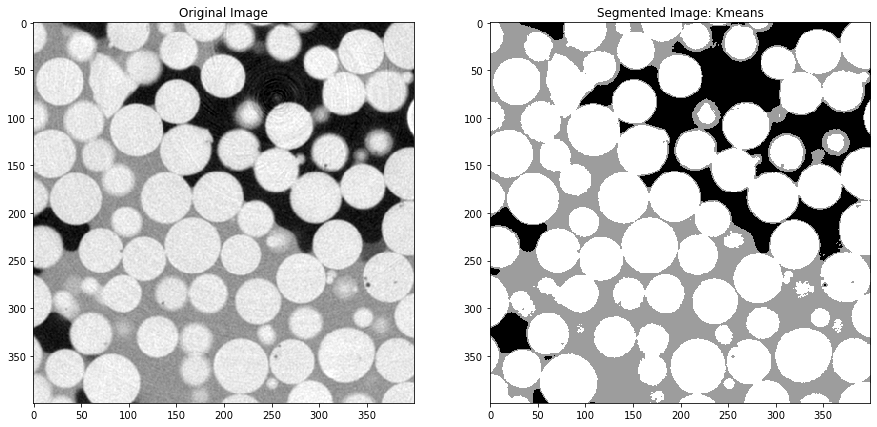

In [3]:
#Kmeans Segmentation
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

def KmeansImg(image, k):
    if np.size(image.shape) == 3:
        z = image.reshape(-1, 3)
    else:
        z = image.reshape(-1)
    z = np.float32(z)

    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 20, 1.0)

    ret, label, center = cv.kmeans(z, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

    center = np.uint8(center)
    res = center[label.flatten()]
    img = res.reshape(image.shape)
    return img

# Read an image
img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)

img1 = KmeansImg(img, 3)
cv.imwrite('GB_Kmeans.tif', img1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7.5))
ax1.imshow(img, cmap='gray')
ax1.set_title('Original Image')
ax2.imshow(img1, cmap='gray')
ax2.set_title('Segmented Image: Kmeans')

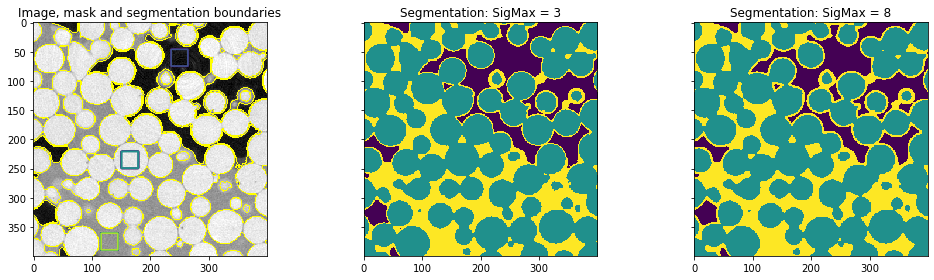

In [2]:
#Trainable segmentation using local features and random forests OR gradient boosting OR SVM
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, segmentation, feature, future
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from functools import partial
import cv2 as cv

img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)

# Build an array of labels for training the segmentation.
# Here we use rectangles but visualization libraries such as plotly can be used to draw a mask on the image.
training_labels = np.zeros(img.shape[:2], dtype=np.uint8)
training_labels[46:75, 236:265] = 1
training_labels[221:250, 151:180] = 2
training_labels[361:390, 116:145] = 3

sigma_min = 1
sigma_max1 = 3
sigma_max2 = 8

features_func1 = partial(feature.multiscale_basic_features,
                        intensity=True, edges=True, texture=True,
                        sigma_min=sigma_min, sigma_max=sigma_max1,
                        multichannel=True)
features1 = features_func1(img)

#Trainable segmentation using local features and random forests/gradient boosting/SVM
#clf = RandomForestClassifier(n_estimators=50, n_jobs=-1, max_depth=10, max_samples=0.05)
clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
#clf = SVC()

clf1 = future.fit_segmenter(training_labels, features1, clf)
result1 = future.predict_segmenter(features1, clf1)


features_func2 = partial(feature.multiscale_basic_features,
                        intensity=True, edges=True, texture=True,
                        sigma_min=sigma_min, sigma_max=sigma_max2,
                        multichannel=True)
features2 = features_func2(img)
clf2 = future.fit_segmenter(training_labels, features2, clf)
result2 = future.predict_segmenter(features2, clf2)

fig, ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(14, 4))
ax[0].imshow(segmentation.mark_boundaries(img, result1, mode='thick'))
ax[0].contour(training_labels)
ax[0].set_title('Image, mask and segmentation boundaries')
ax[1].imshow(result1)
ax[1].set_title('Segmentation: SigMax = 3')
ax[2].imshow(result2)
ax[2].set_title('Segmentation: SigMax = 8')
fig.tight_layout()

(Text(0.5, 1.0, 'Segmentation: SigMax = 8'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

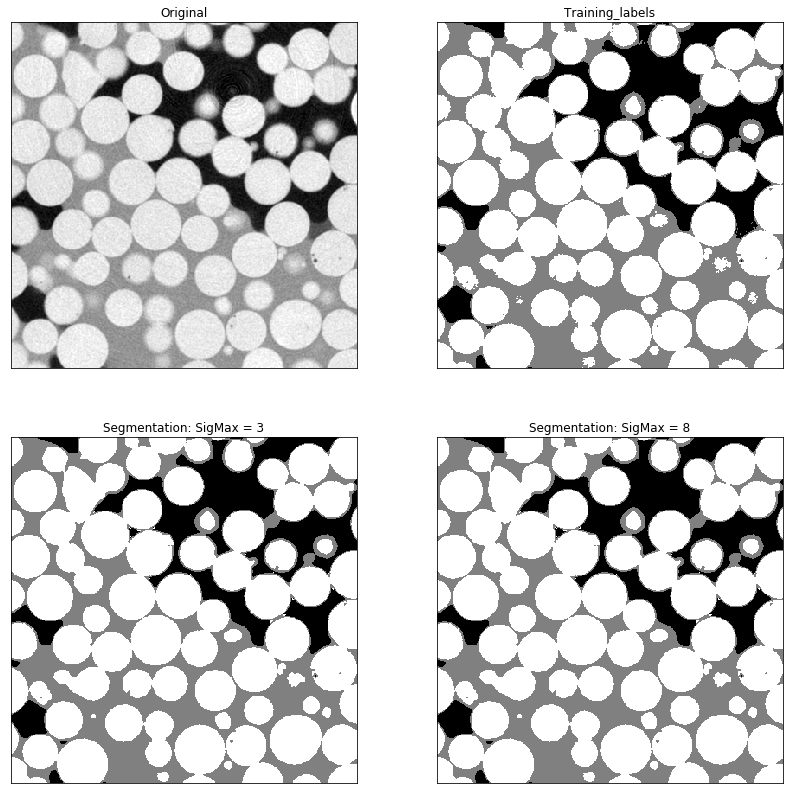

In [6]:
#Train segmentation using local features and random forests OR gradient boosting OR SVM
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, segmentation, feature, future
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from functools import partial
import cv2 as cv

img = cv.imread('GB_2218_O.tif', cv.IMREAD_GRAYSCALE)

# Build an array of labels for training the segmentation.
training = cv.imread('GB_Kmeans.tif', cv.IMREAD_GRAYSCALE)
training_labels = np.zeros(img.shape[:2], dtype=np.uint8)
Pore = (training==32)
Water = (training==153)
BG = (training==229)
training_labels= 1*Pore + 2*Water + 3*BG

sigma_min = 1
sigma_max1 = 3
sigma_max2 = 8

features_func1 = partial(feature.multiscale_basic_features,
                        intensity=True, edges=True, texture=True,
                        sigma_min=sigma_min, sigma_max=sigma_max1,
                        multichannel=True)
features1 = features_func1(img)

#Segmentation using local features and random forests/gradient boosting/SVM
#clf = RandomForestClassifier(n_estimators=50, n_jobs=-1, max_depth=10, max_samples=0.05)
clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
#clf = SVC()

clf1 = future.fit_segmenter(training_labels, features1, clf)
result1 = future.predict_segmenter(features1, clf1)


features_func2 = partial(feature.multiscale_basic_features,
                        intensity=True, edges=True, texture=True,
                        sigma_min=sigma_min, sigma_max=sigma_max2,
                        multichannel=True)
features2 = features_func2(img)
clf2 = future.fit_segmenter(training_labels, features2, clf)
result2 = future.predict_segmenter(features2, clf2)

plt.figure(figsize=(14,14))
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(training_labels,cmap = 'gray')
plt.title('Training_labels'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(result1,cmap = 'gray')
plt.title('Segmentation: SigMax = 3'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(result2,cmap = 'gray')
plt.title('Segmentation: SigMax = 8'), plt.xticks([]), plt.yticks([])

In [ ]:
# Image Registration
import cv2
import matplotlib.pyplot as plt
import numpy as np
 
# Open the image files.
img1_color = cv2.imread("To_Align.png")  # Image to be aligned.
img2_color = cv2.imread("Ref.png")    # Reference image.
 
# Convert to grayscale.
img1 = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2_color, cv2.COLOR_BGR2GRAY)
height, width = img2.shape
 
# Create ORB detector with 5000 features.
orb_detector = cv2.ORB_create(5000)#cv2.xfeatures2d.SIFT_create()#
 
# Find keypoints and descriptors.
# The first arg is the image, second arg is the mask #  (which is not required in this case).
kp1, d1 = orb_detector.detectAndCompute(img1, None)
kp2, d2 = orb_detector.detectAndCompute(img2, None)
print(d1.dtype)
 
# Match features between the two images.
# We create a Brute Force matcher with Hamming distance as measurement mode.
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
 
# Match the two sets of descriptors.
matches = matcher.match(np.uint8(d1), np.uint8(d2))
 
# Sort matches on the basis of their Hamming distance.
sorted(matches, key=lambda x: x.distance) 
 
# Take the top 90 % matches forward.
matches = matches[:int(len(matches)*0.9)]
no_of_matches = len(matches)
 
# Define empty matrices of shape no_of_matches * 2 to restore 90% most matched points
p1 = np.zeros((no_of_matches, 2))
p2 = np.zeros((no_of_matches, 2))
 
for i in range(len(matches)):
    p1[i, :] = kp1[matches[i].queryIdx].pt
    p2[i, :] = kp2[matches[i].trainIdx].pt
 
# Find the homography matrix.
homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)
 
# Use this matrix to transform the colored image wrt the reference image.
transformed_img = cv2.warpPerspective(img1_color,
                    homography, (width, height))
 
# Show & Save the output
plt.figure()
plt.imshow(transformed_img)
cv2.imwrite('output_ORB.jpg', transformed_img)

In [ ]:
#Lucas-Kanade Optical Flow
import numpy as np
import cv2

# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 500,
                       qualityLevel = 0.3,
                       minDistance = 5,
                       blockSize = 5)

# Parameters for lucas kanade optical flow
lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_COUNT | cv2.TERM_CRITERIA_EPS, 100, 0.001))

# Take first frame and find corners in it
img1_color = cv2.imread("Frame1.jpg", cv2.IMREAD_COLOR)
img1_color = cv2.resize(img1_color, (600, 400))
old_gray = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)

p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

img2_color = cv2.imread("Frame2.jpg", cv2.IMREAD_COLOR)
img2_color = cv2.resize(img2_color, (600, 400))
frame_gray = cv2.cvtColor(img2_color, cv2.COLOR_BGR2GRAY)

# calculate optical flow
p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

# Select good points
good_new = p1[st==1]
good_old = p0[st==1]

# Create a mask image for drawing purposes
mask = np.zeros_like(img1_color)
color = (255, 255, 255)
                     
# draw the tracks
for i,(new,old) in enumerate(zip(good_new,good_old)):
    a,b = new.ravel()
    c,d = old.ravel()
    mask  = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color, 2)
    frame = cv2.circle(img2_color, (int(a),int(b)), 3, color, -1)
    
img = cv2.add(frame,mask)

cv2.imshow('Lucas-Kanade Optical Flow',img)
cv2.waitKey(0)

In [ ]:
#Dense Optical Flow #https://sandipanweb.wordpress.com/2018/02/25/implementing-lucas-kanade-optical-flow-algorithm-in-python/
import cv2
import numpy as np
import matplotlib.pyplot as plt

img1_color = cv2.imread("Frame1.jpg")
img1_color = cv2.resize(img1_color, (600, 400))
prvs = cv2.cvtColor(img1_color,cv2.COLOR_BGR2GRAY)

img2_color = cv2.imread("Frame2.jpg")
img2_color = cv2.resize(img2_color, (600, 400))
next = cv2.cvtColor(img2_color,cv2.COLOR_BGR2GRAY)
#computes a dense optical flow for each pixel using the Gunnar Farneback’s algorithm
flow = cv2.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.2, 0)#cv2.OPTFLOW_FARNEBACK_GAUSSIAN
plt.hist(flow.reshape(-1,1), bins = 100)

#remove outliers
index = (np.abs(flow) < 0.1)
flow[index] = 0
flow_modi = flow
plt.hist(flow_modi.reshape(-1,1), bins = 100)

mag, ang = cv2.cartToPolar(flow_modi[...,0], flow_modi[...,1])
fig, axs = plt.subplots(1, 2, figsize=(10,10))
axs[0].imshow(mag, cmap='jet')
axs[1].imshow(ang, cmap='jet')

hsv = np.zeros_like(img1_color)
hsv[...,1] = 255
hsv[...,0] = ang*180/np.pi/2
hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)

cv2.imshow('Dense Optical Flow',rgb)
cv2.waitKey(0)